In [1]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from pandas import *
from PIL import Image
from skimage import io

plt.style.use('seaborn-white')

plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left='off',      # ticks along the bottom edge are off
    right='off',      # ticks along the bottom edge are off
    labelleft='off') # labels along the bottom edge are off

In [2]:
df = read_csv('../../data/features_women.csv', index_col='asin')

In [3]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
asin,,,,,,,,,,,,,,,,,,,,,
B005IYS5ZA,0.0,0.8051,0.0000,0.0,0.000,0.1,0.0000,0.3484,0.0000,1.3334,...,0.0000,0.0,0.0,0.0,0.0000,3.2731,0.0,0.0507,0.0,0.0000
B007KHXTXQ,0.0,0.0000,2.9935,0.0,1.199,0.0,0.0000,0.0000,2.8597,0.0000,...,0.0000,0.0,0.0,0.0,2.6146,0.0000,0.0,0.0201,0.0,0.0000
B00IA6VTO2,0.0,3.2722,0.0000,0.0,0.000,0.0,0.3835,0.0000,0.0000,0.0000,...,3.5435,0.0,0.0,0.0,0.0000,0.7942,0.0,0.0000,0.0,0.0000
B0091UELGO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,0.0753,0.0,0.0000,0.0,2.6916
B006CB31NO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,1.2655,0.0,0.0000,0.0,3.5446


In [4]:
meta = read_csv('../data/metadata_women.csv')\
           .loc[:, ['asin','imUrl']]\
           .set_index('asin')

In [5]:
meta.head()

,imUrl
asin,
B0002KZ1AM,http://ecx.images-amazon.com/images/I/518VBicj...
B0002KZ0QM,http://ecx.images-amazon.com/images/I/5184vXiM...
B0002TTZ1E,http://ecx.images-amazon.com/images/I/41MES3xW...
B0002TTZUU,http://ecx.images-amazon.com/images/I/41MES3xW...
B0002TTZVO,http://ecx.images-amazon.com/images/I/41MES3xW...


150


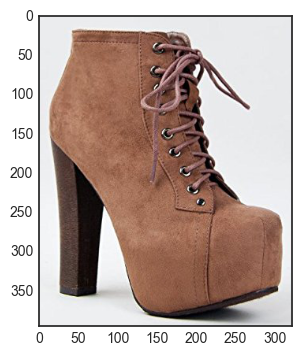

151


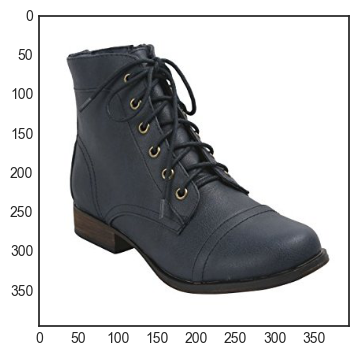

152


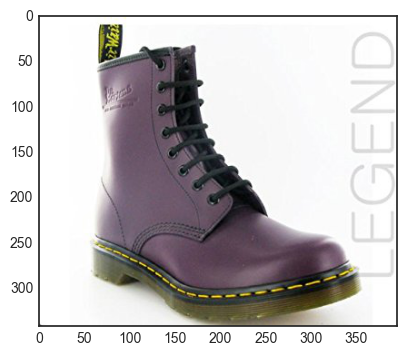

153


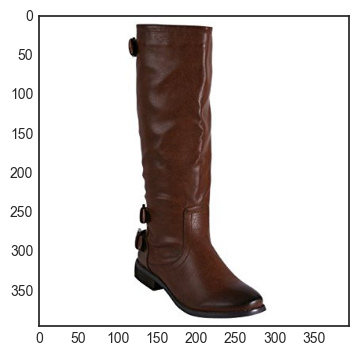

154


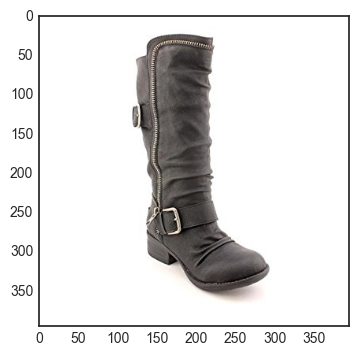

155


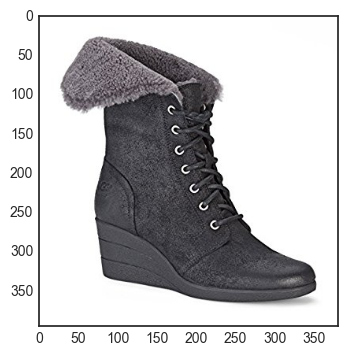

156


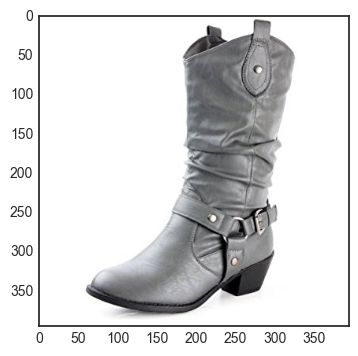

157


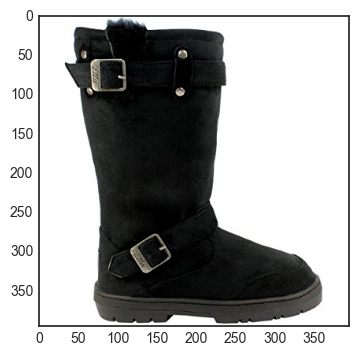

158


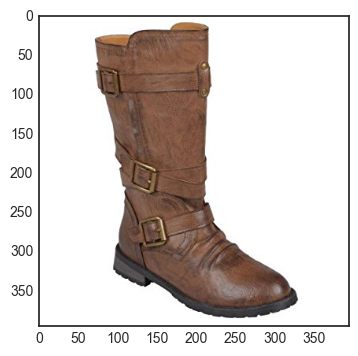

159


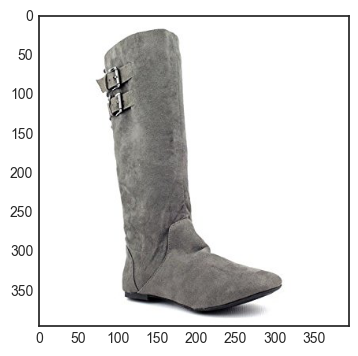

160


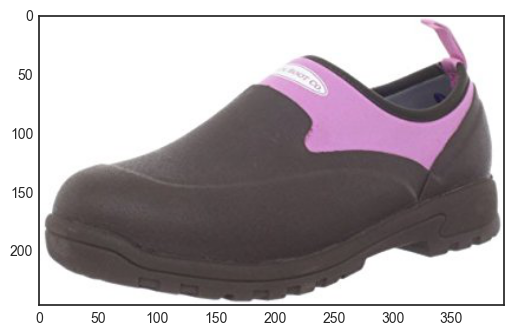

161


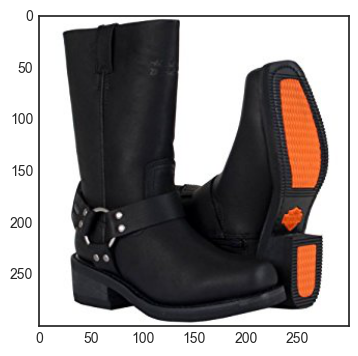

162


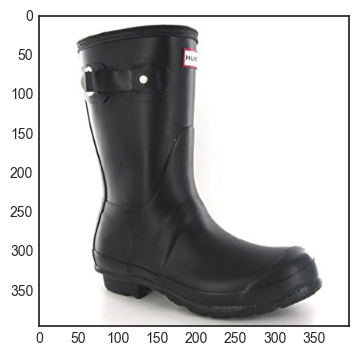

163


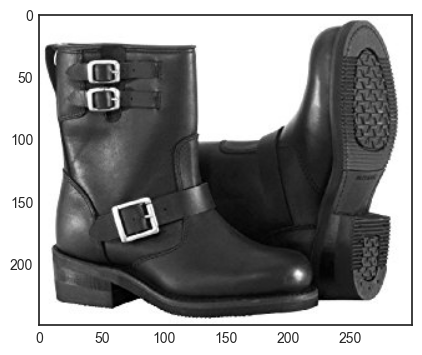

164


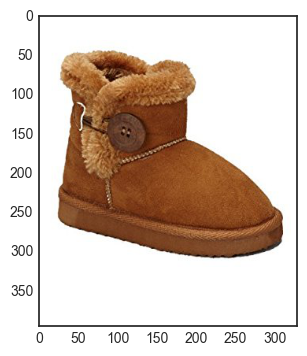

165


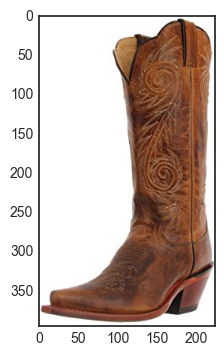

166


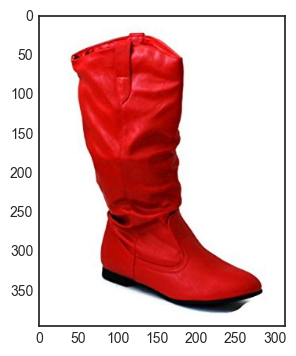

167


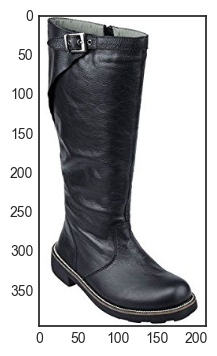

168


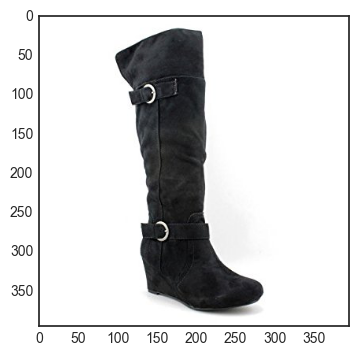

169


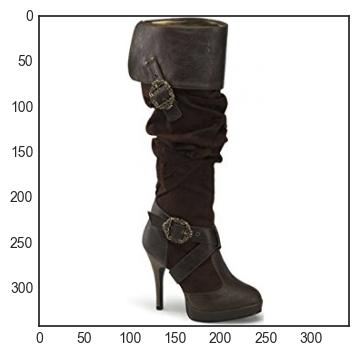

170


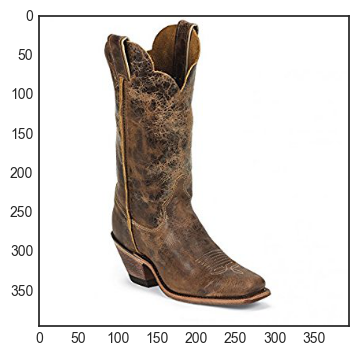

171


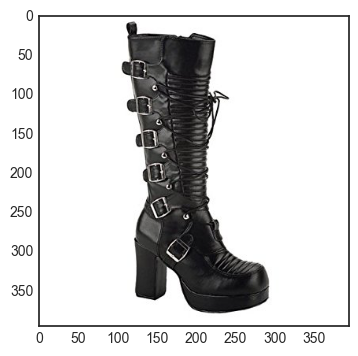

172


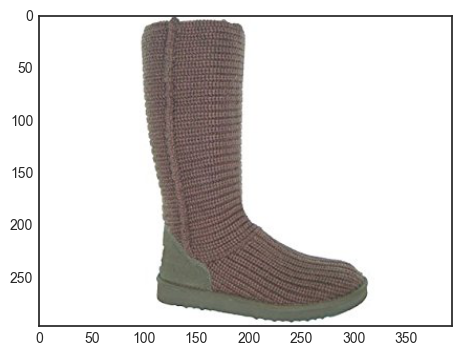

173


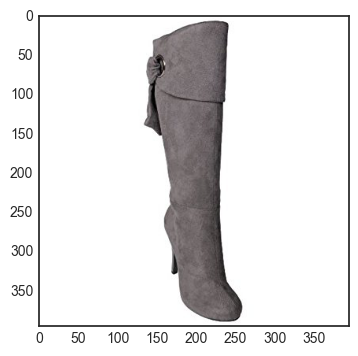

174


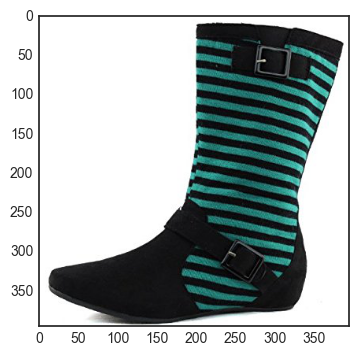

175


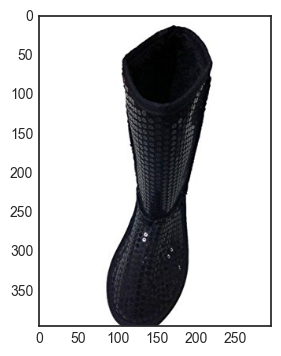

176


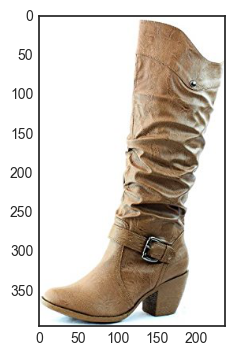

177


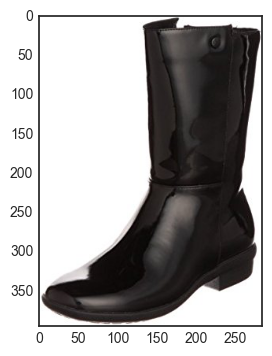

178


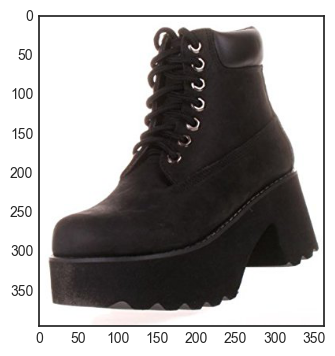

179


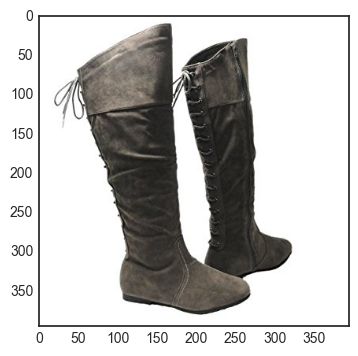

180


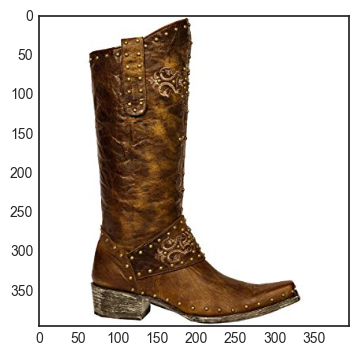

181


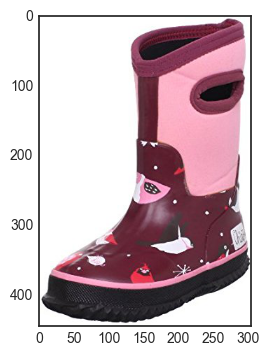

182


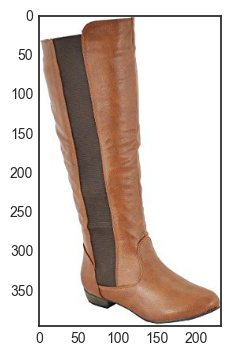

183


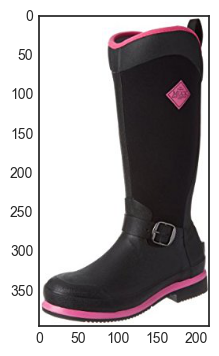

184


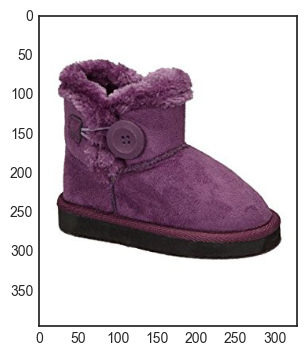

185


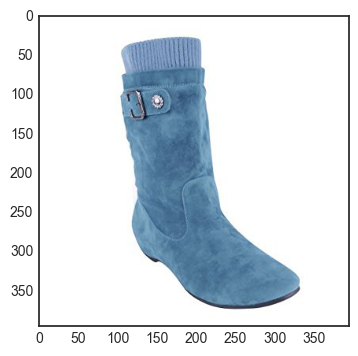

186


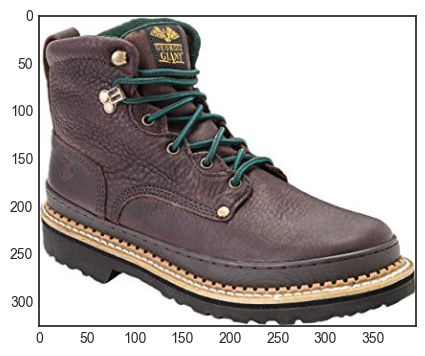

187


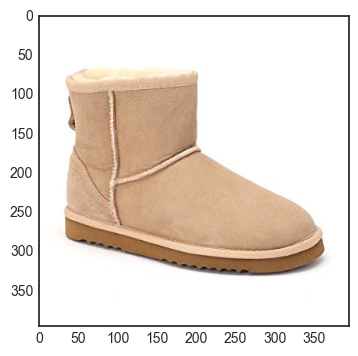

188


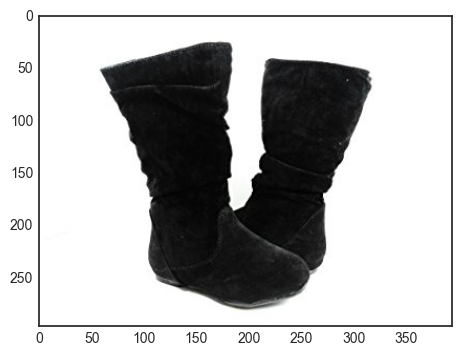

189


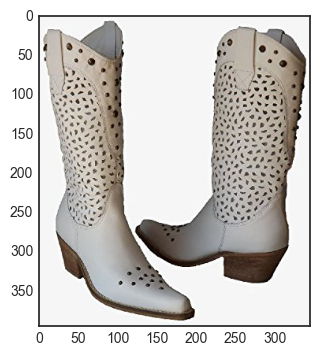

190


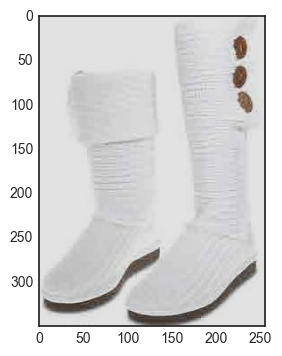

191


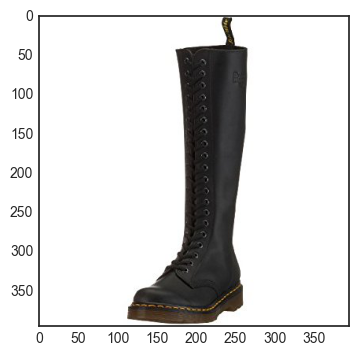

192


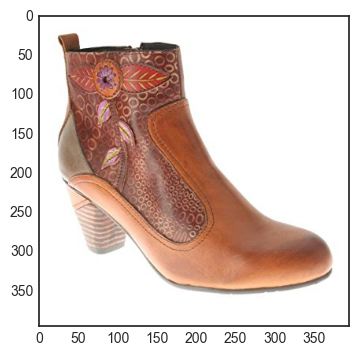

193


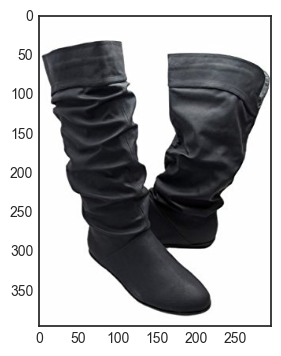

194


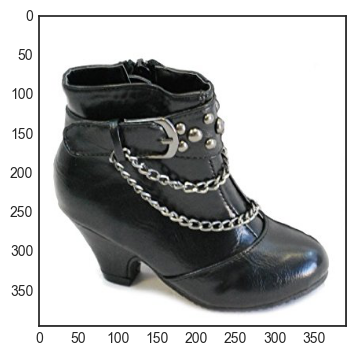

195


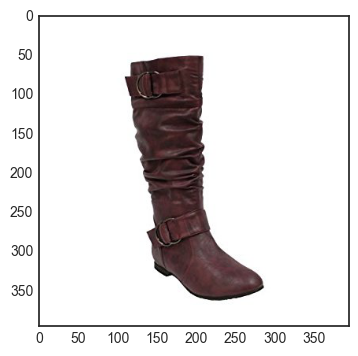

196


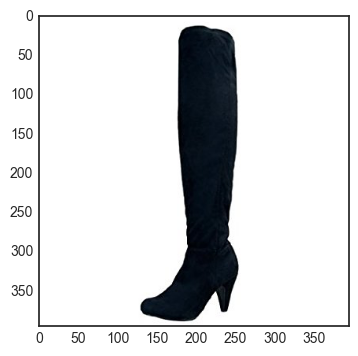

197


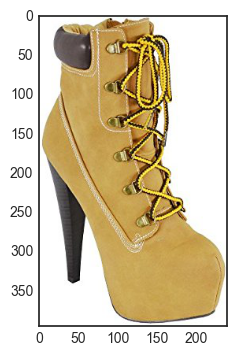

198


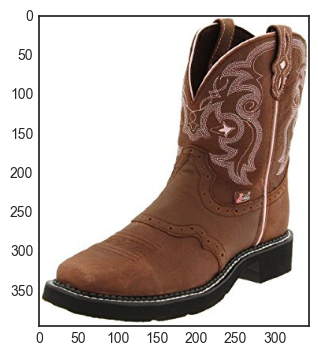

199


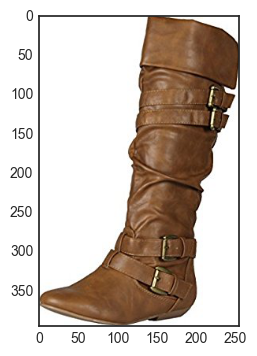

200


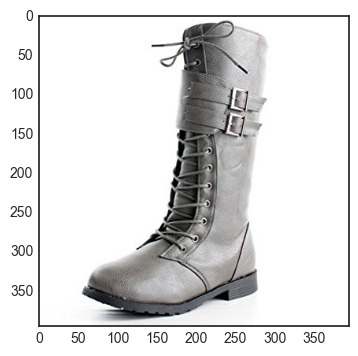

201


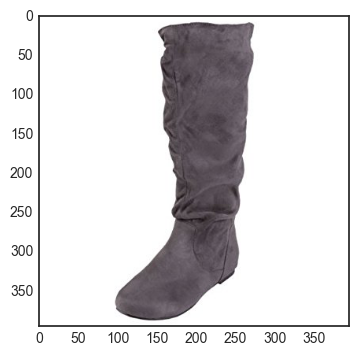

202


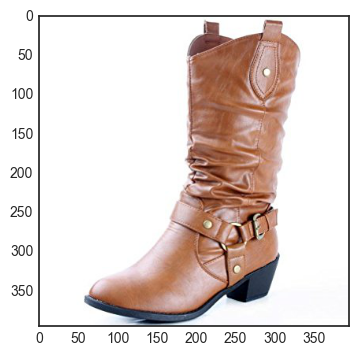

203


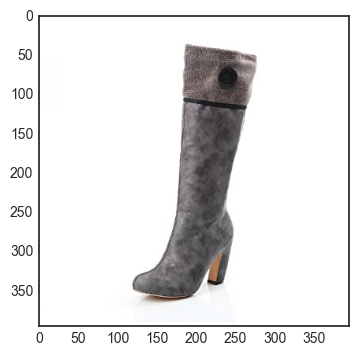

204


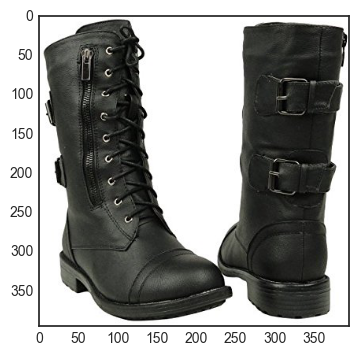

205


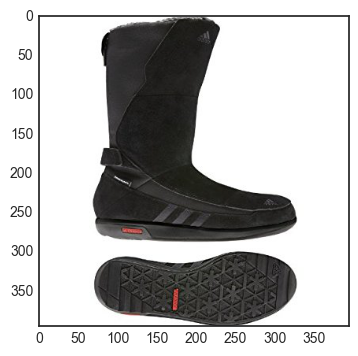

206


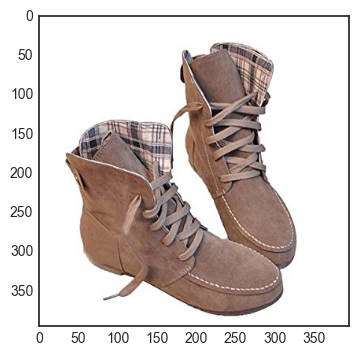

207


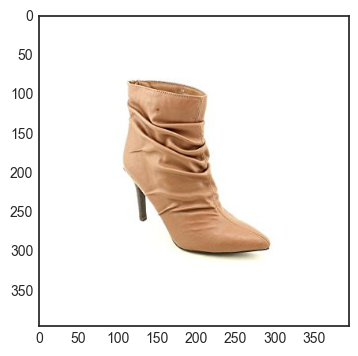

208


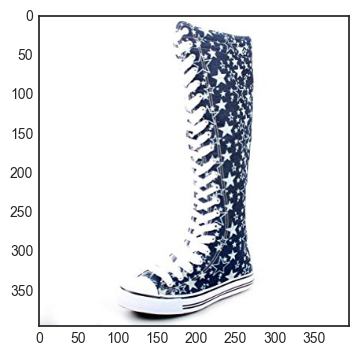

209


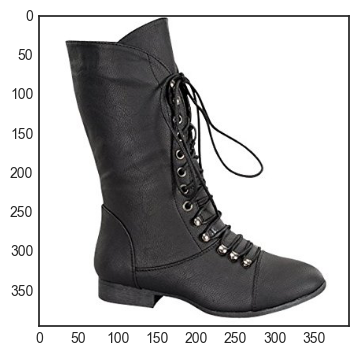

210


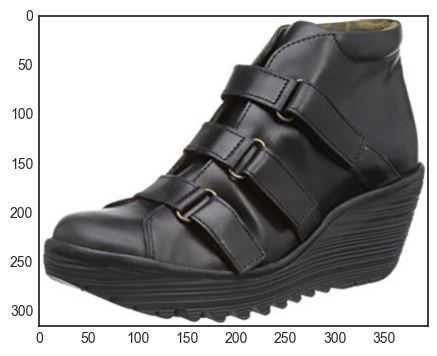

211


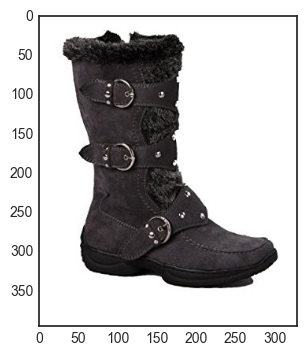

212


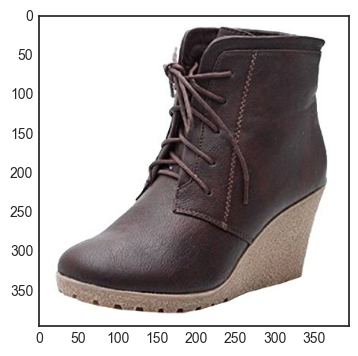

213


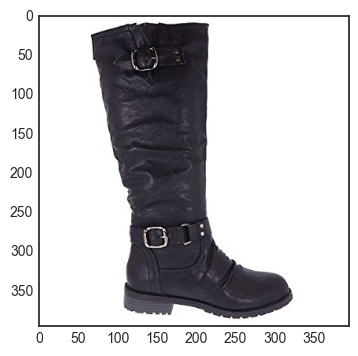

214


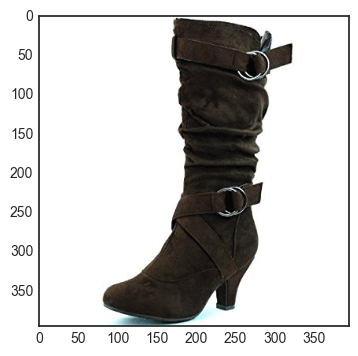

215


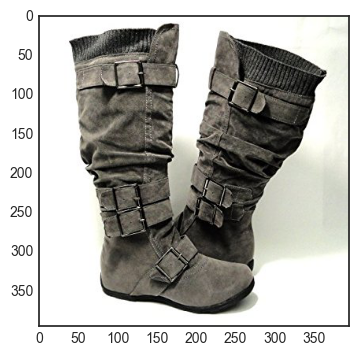

216


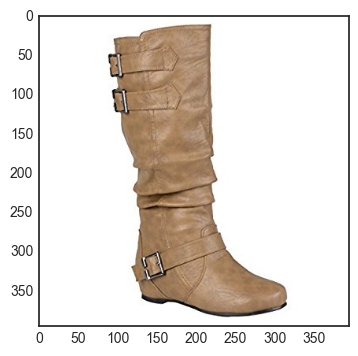

217


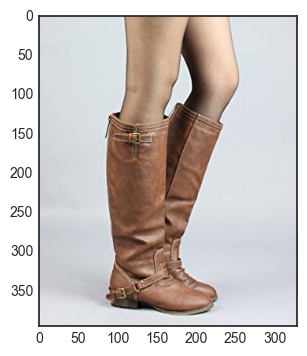

218


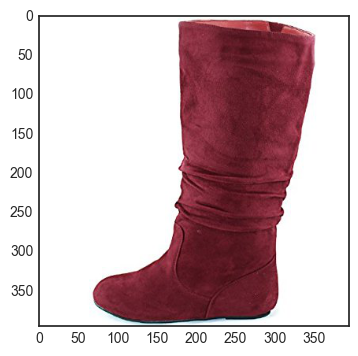

219


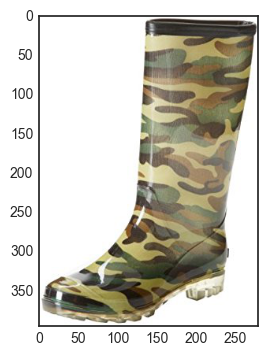

220


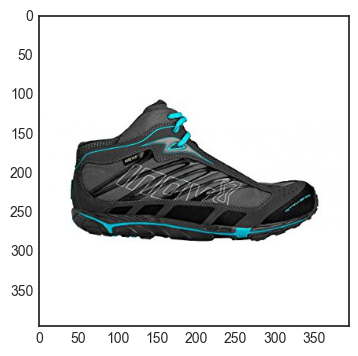

221


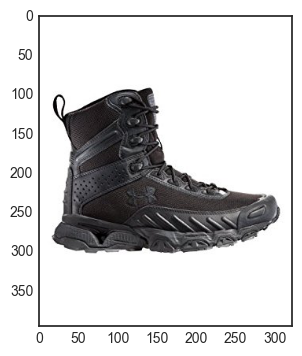

222


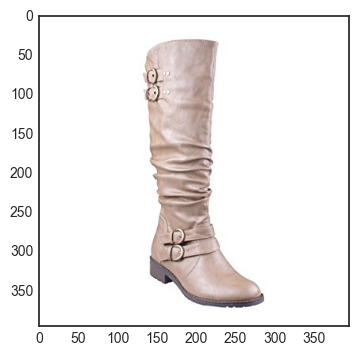

223


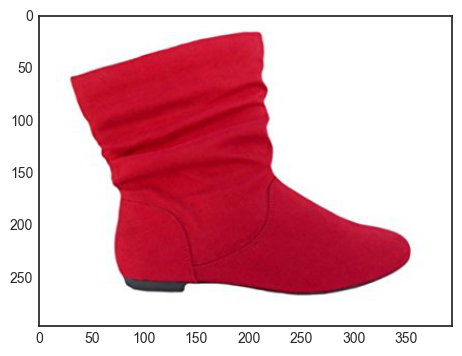

224


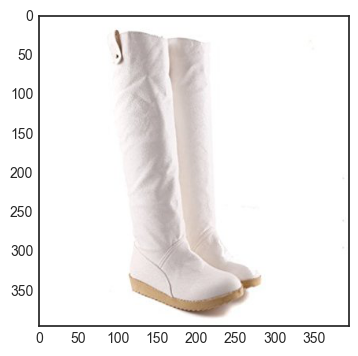

225


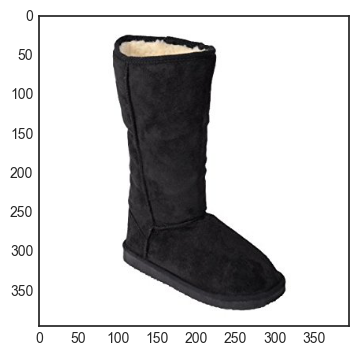

226


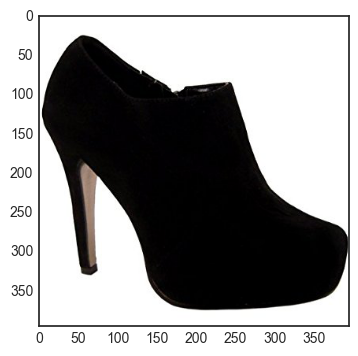

227


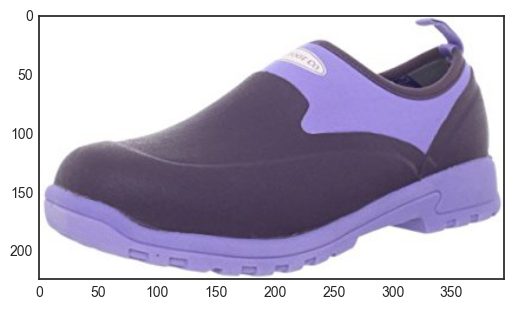

228


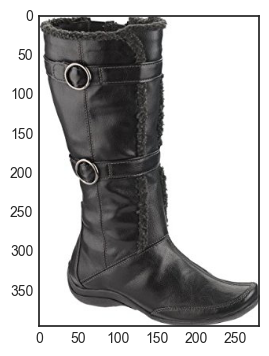

229


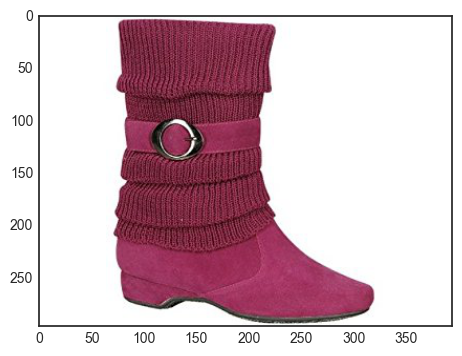

230


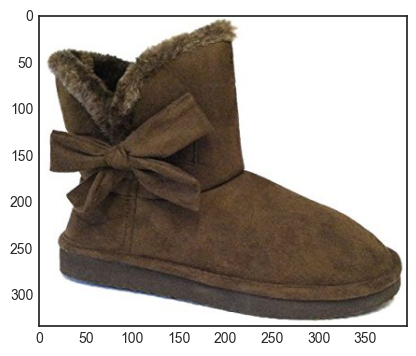

231


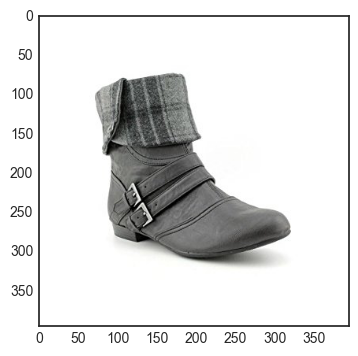

232


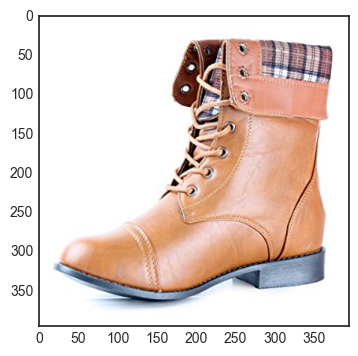

233


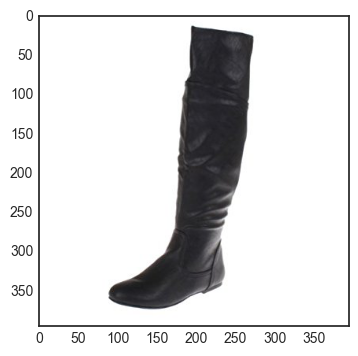

234


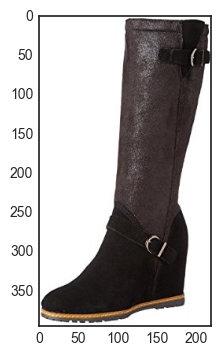

235


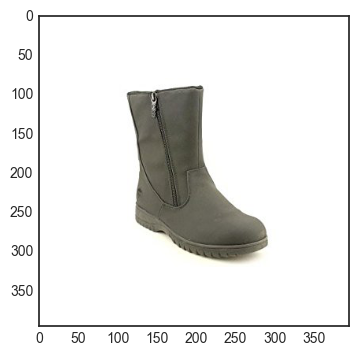

236


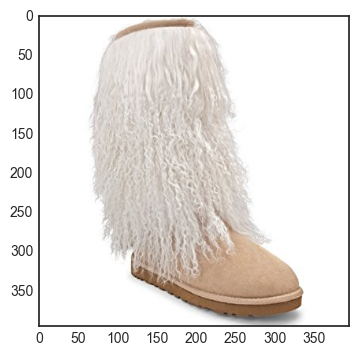

237


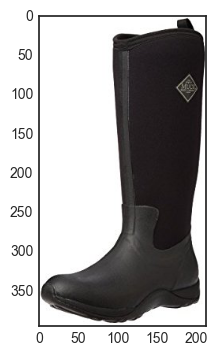

238


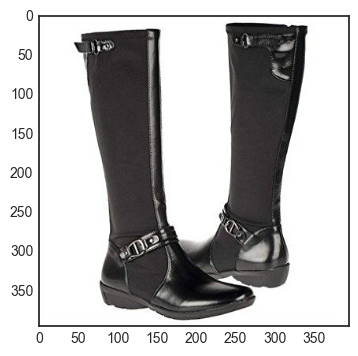

239


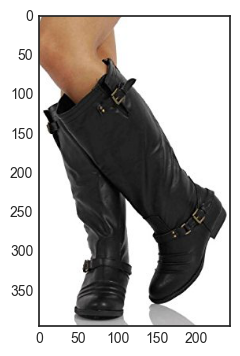

240


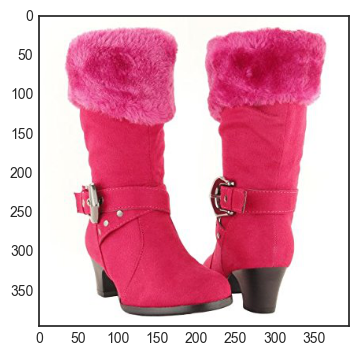

241


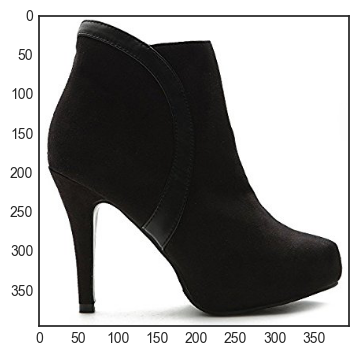

242


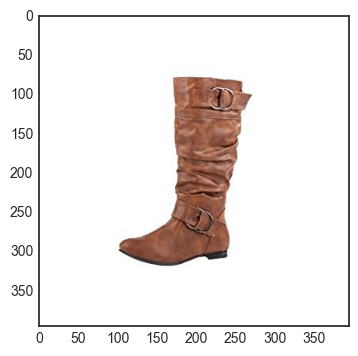

243


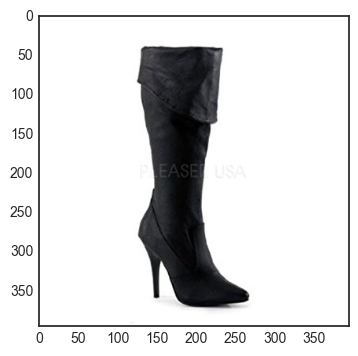

244


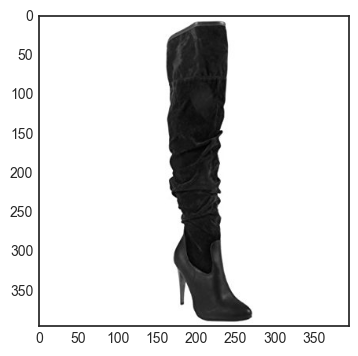

245


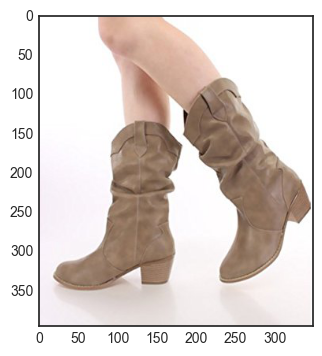

246


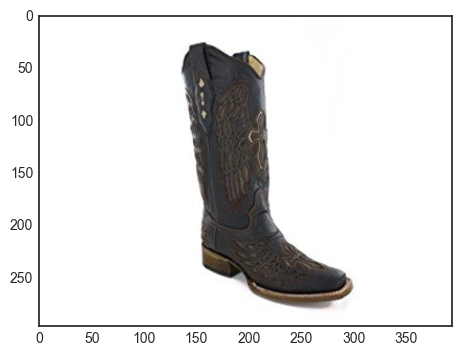

247


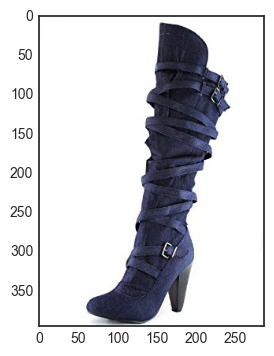

248


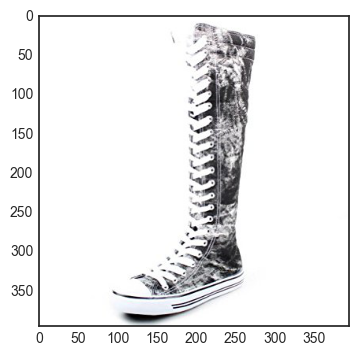

249


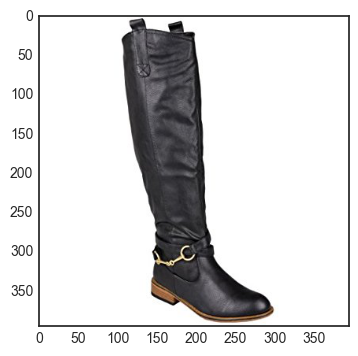

In [16]:
X = df.values

n = 150
for n in range(150,250):
    print n
    asin = df.index[n]
    url = meta.loc[asin, 'imUrl']
    image = io.imread(url)
    plt.imshow(image)
    plt.show()

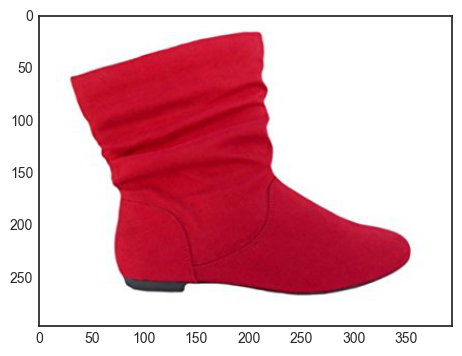

In [114]:
# 174, 181, 187 (easy), 208, 191, 162 (hunter)
# 172, 198, 217 (no legs), 219 (bad job -- outlier), 223, 225, 236 (furry)
n = 223
asin = df.index[n]
url = meta.loc[asin, 'imUrl']
image = io.imread(url)
plt.imshow(image)
plt.show()

In [105]:
from sklearn.neighbors import NearestNeighbors

nn = NearestNeighbors(n_neighbors=5, radius=1.0, algorithm='ball_tree', 
                      leaf_size=30, metric='minkowski', p=2, 
                      metric_params=None, n_jobs=1)

nn.fit(X)
neighbors = np.squeeze(nn.kneighbors(X[n], 6, return_distance=True)[1])

/Users/jp/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


162


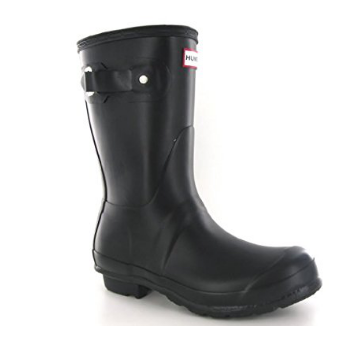

284


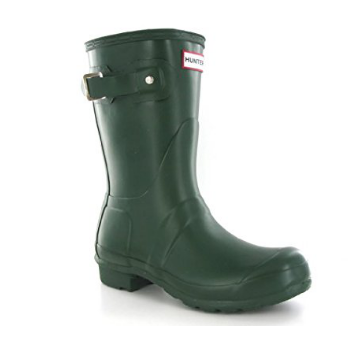

2725


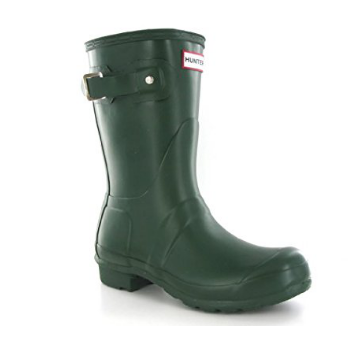

2454


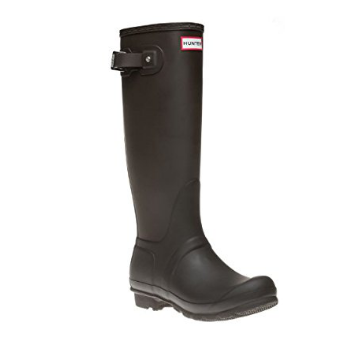

1736


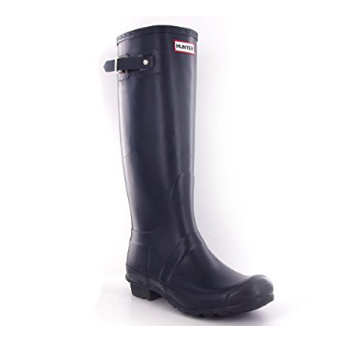

2662


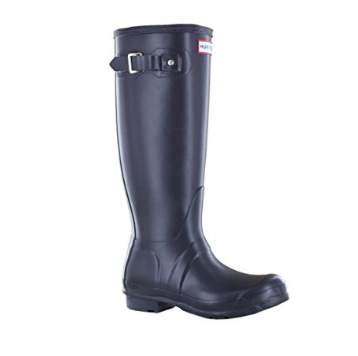

In [106]:
for img in neighbors:
    print img
    asin = df.index[img]
    url = meta.loc[asin, 'imUrl']
    image = io.imread(url)
    plt.imshow(image)
    plt.axis('off')    
    plt.show()

In [107]:
from sklearn.metrics.pairwise import pairwise_distances

pw = pairwise_distances(X, metric='cosine', n_jobs=1)
pairwise_top5 = pw[n].argsort()[:6]

162


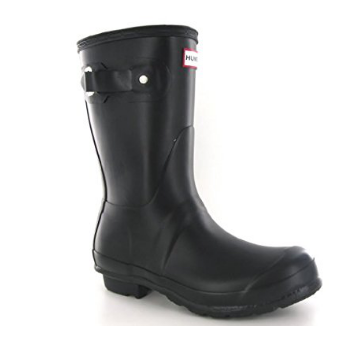

284


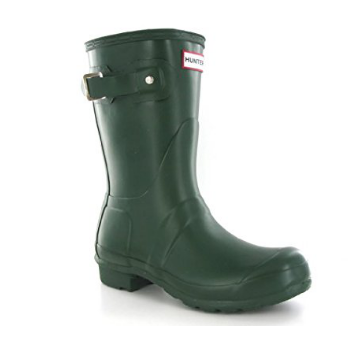

2725


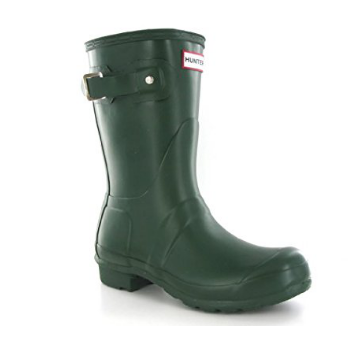

2454


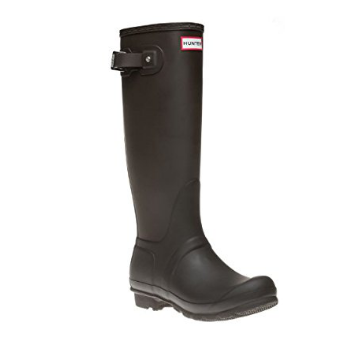

1736


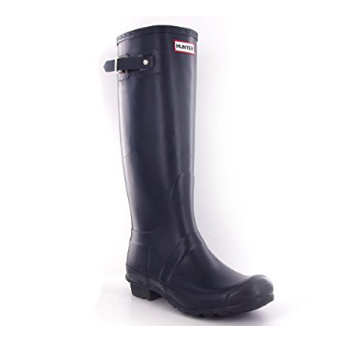

2662


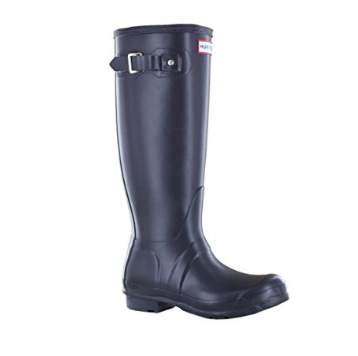

In [108]:
for img in pairwise_top5:
    print img
    asin = df.index[img]
    url = meta.loc[asin, 'imUrl']
    image = io.imread(url)
    plt.imshow(image)
    plt.axis('off')    
    plt.show()

In [109]:
from annoy import AnnoyIndex
import random

f = df.shape[1]
t = AnnoyIndex(f)  # Length of item vector that will be indexed
for i in xrange(df.shape[0]):
    v = df.iloc[i, :].values
    t.add_item(i, v)

t.build(10) # 10 trees
t.save('annoy_neighbors.ann')

True

In [110]:
u = AnnoyIndex(f)
u.load('annoy_neighbors.ann') 
annoy_neighbors = u.get_nns_by_item(n, 5) 

162


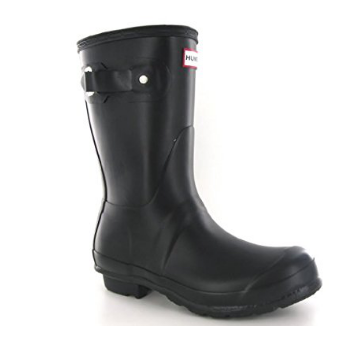

284


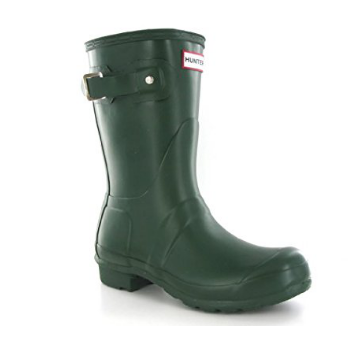

2725


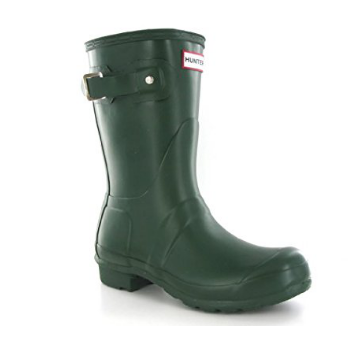

2454


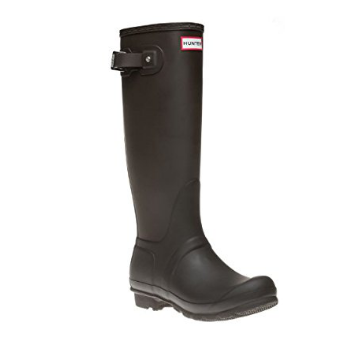

1736


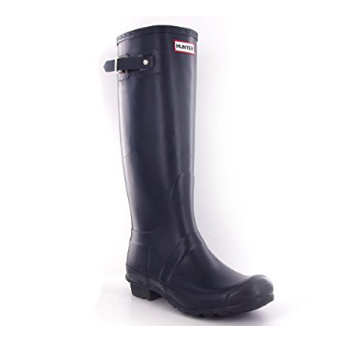

In [111]:
for img in annoy_neighbors:
    print img
    asin = df.index[img]
    url = meta.loc[asin, 'imUrl']
    image = io.imread(url)
    plt.imshow(image)
    plt.axis('off')    
    plt.show()